In [8]:
import openslide
import glob
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data.dataset import Dataset
from PIL import Image
from tqdm.auto import tqdm
from torch.utils.data.dataloader import DataLoader
import torchvision.models as models
import random
import os
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
import datetime
import pytz
import pandas as pd
import tifffile as tiff
import segmentation_models_pytorch as smp
from collections import OrderedDict
import copy
import yaml
from dataset import CustomDataset





## Setting Parameter

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [2]:
cfg = yaml.load(open("Your/Config/Path", "r"), Loader=yaml.Loader)


In [5]:
# Fix Seed
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

seed_everything(cfg['seed'])

In [ ]:
# server path
svspath = cfg["svs_path"]
output_path = "Your/Output/Path"
test_data_path = cfg["tile_path"]
tsv_path = cfg["tsv_path"]
pth_path = "Your/pth/Path"


## Load Data

In [8]:
slide = openslide.OpenSlide(svspath)
dimension = slide.dimensions

In [9]:
table = pd.read_csv(tsv_path, sep='\t')
table[:5]

,Tile,Width,Height,Keep,Row,Column
0,C3L-00017-22_0000,512,512,0,0,0
1,C3L-00017-22_0001,512,512,0,0,1
2,C3L-00017-22_0002,512,512,0,0,2
3,C3L-00017-22_0003,512,512,0,0,3
4,C3L-00017-22_0004,512,512,0,0,4


In [10]:
# tile image load
test_img = glob.glob(f"{test_data_path}/*")
img_split_dict = {}
for index, name in enumerate(table["Tile"]):
    img_split_dict[name] = cv2.imread(sorted(test_img)[index])

In [11]:
# remove background tile
tile_name = table[table["Keep"]==1]["Tile"]
tile_path = list(test_data_path+'/'+tile_name+".png")

In [13]:
test_transform = A.Compose([
        A.Resize(cfg["img_size"], cfg["img_size"]),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
])

In [14]:
# test data set
test_set = CustomDataset(path= tile_path,
                         name = tile_name,
                         transform = test_transform)

In [15]:
test_loader = DataLoader(test_set, batch_size=cfg["batch_size"])

## Test

In [17]:
# Set Model
if cfg["model"] == "unet":
    model = ResUNet(num_classes=1, output_size=cfg["img_size"])

elif cfg["model"] == "fpn":
    model = smp.FPN(
        encoder_name=cfg[
            "backbone"
        ],  # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
        encoder_weights="imagenet",  # use `imagenet` pre-trained weights for encoder initialization
        in_channels=3,  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
        classes=1,  # model output channels (number of classes in your dataset)
        activation=None,
    )

elif cfg["model"] == "deeplabv3+":
    model = smp.DeepLabV3Plus(
        encoder_name=cfg["backbone"],
        encoder_weights="imagenet",
        in_channels=3,
        classes=1,
        activation=None,
        decoder_atrous_rates=cfg["dilations"],
    )
elif cfg["model"] == "pspnet+":
    model = smp.PSPNet(
        encoder_name=cfg[
            "backbone"
        ],  # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
        encoder_weights="imagenet",  # use `imagenet` pre-trained weights for encoder initialization
        in_channels=3,  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
        classes=1,  # model output channels (number of classes in your dataset)
        activation=None,
        psp_use_batchnorm=True,
    )

In [19]:
# pretrained model load
loaded_state_dict = torch.load(pth_path)
new_state_dict = OrderedDict()
for n, v in loaded_state_dict["model"].items():
    name = n.replace("module.", "")
    new_state_dict[name] = v

model.load_state_dict(new_state_dict)
model = model.to(device)

In [21]:
# Test
def Test(model, test_loader, device):
    model.eval()
    label_dict = {}
    with torch.no_grad():
        for img, name in tqdm(test_loader):
            out = model(img.to(device))
            pred = torch.ge(out.sigmoid(), 0.5).float()
            output = pred.cpu().detach().numpy().astype(int)
            for name, output in zip(name, output):
                label_dict[name] = output.squeeze()
        return label_dict

In [22]:
label_dict = Test(model, test_loader, device)

  0%|          | 0/581 [00:00<?, ?it/s]

## Concat Patch Image

In [23]:
def convert_grayscale_to_bgr(grayscale_image):
    # Convert grayscale image to RGB
    rgb_image = np.repeat(grayscale_image[:, :, np.newaxis], 3, axis=2)
    return rgb_image

In [24]:
def apply_mask_image(image, label, alpha=0.3):

    # Convert a mask image to a 3-channel format and apply color.
    for key, value in label.items():
        label[key] = convert_grayscale_to_bgr(value) * np.array([0, 255, 0]) # Green


    for key1, value1 in tqdm(image.items()):
        for key2, value2 in label.items():
            value2 = value2.astype(np.uint8)
            if key1 == key2:
                # Resize
                if value1.shape != value2.shape:
                    value2 = cv2.resize(value2.astype(float), (value1.shape[1], value1.shape[0]), interpolation=cv2.INTER_LINEAR)
                # Calculate only the areas where the mask is applied.
                mask1 = value2 > 0
                mask1 = mask1.astype(value1.dtype)
                # Overlay the mask on top of the original image in the areas where the mask is applied.
                masked_image1 = cv2.multiply(value1, mask1)
                masked_image2 = cv2.addWeighted(masked_image1, alpha, value2, 1.0 - alpha, 0)
                
                # Apply the original image to the areas where the mask is not applied.
                mask2 = value2 == 0
                mask2 = mask2.astype(value1.dtype)
                masked_image3 = cv2.multiply(value1, mask2)

                # Concat the areas with the applied mask and the areas without the applied mask.
                result_image = cv2.add(masked_image2, masked_image3)
                image[key1] = result_image
    image = dict(sorted(image.items(), key=lambda x:x[0]))
    return image

In [27]:
def image_crop_list_to_total_image(img_split_dict, table, dimension):
    # Merge Patch Image to Whole Image

    out_image_array = np.zeros((dimension[1],dimension[0], 3), dtype = np.uint8)

    x = 0
    y = 0
    for key, value in (img_split_dict.items()):
        column = int(table[table["Tile"]==key]["Column"])
        row = int(table[table["Tile"]==key]["Row"])
        if column == 0 and row!=0:
            x = 0
            y = y+height
        width = int(table[table["Tile"]==key]["Width"])
        height = int(table[table["Tile"]==key]["Height"])

        out_image_array[y:y+height,x:x+width] = value
        x = x+width
    return out_image_array

In [26]:
# Patch Image Overlay
img_split_dict = apply_mask_image(img_split_dict, label_dict)

  0%|          | 0/1634 [00:00<?, ?it/s]

In [ ]:
    # Merge Patch Image to Whole Image
merge_image = image_crop_list_to_total_image(img_split_dict, table, dimension)
merge_image_rgb = merge_image[...,::-1]

merge_image_pil = Image.fromarray(merge_image_rgb) # PIL Image convert

# Resize to Visualize
resize_image = test_merge_image.resize((int(test_merge_image.width / 6), int(test_merge_image.height / 6)))

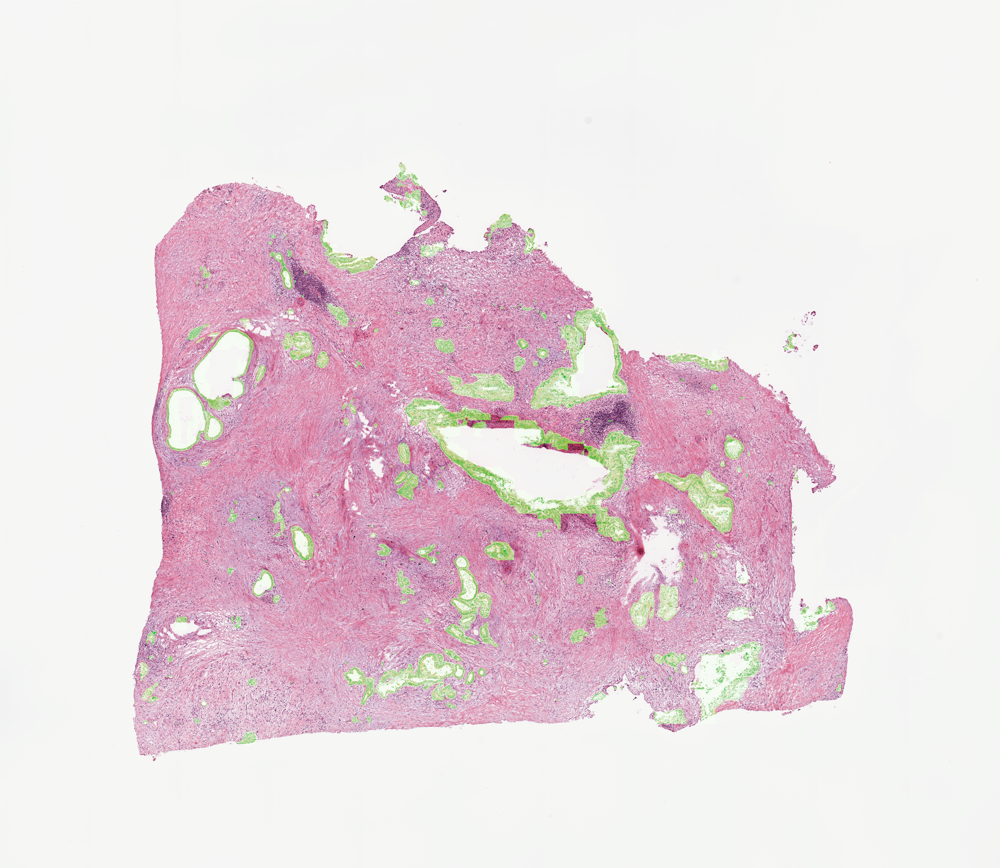

In [30]:
resize_image

## Save Image

In [31]:
os.makedirs(f"{output_path}", exist_ok=True)
merge_image_pil.save(f"{output_path}/Image_name.jpg", 'JPEG') # png or jpg ..